In [5]:
import pandas as pd
import numpy as np
import os
import nltools as nlt
import nilearn as nil
import nibabel as nib
import warnings

In [6]:
pd.set_option('display.max_rows', 99)

## Behavioral data

In [7]:
#load behavioral data

import dev_wtp_io_utils
behavioral_data_path = '/gpfs/projects/sanlab/shared/DEV/nonbids_data/Tasks/WTP/output/'
[run_list, run_event_df_list, run_event_stage_df_list] = dev_wtp_io_utils.get_comprehensive_run_data_from_mat_dir(behavioral_data_path)



subject 040, subject 039, subject 168, subject 063, subject 129, subject 067, subject 150, subject 159, 
SUBJ 159, 2, run14
no data for this run.
subject 004, subject 091, subject 180, subject 008, subject 095, subject 099, subject 032, 
SUBJ 032, 2, run2
no data for this run.
subject 036, subject 171, subject 100, 
SUBJ 100, 3, run2
no data for this run.
subject 109, subject 041, subject 060, subject 059, subject 130, subject 064, subject 068, subject 001, subject 087, subject 192, subject 005, subject 121, subject 999, 
SUBJ 999, 2, run1
no data for this run.


SUBJ 999, 2, run2
Data for this run is not in the expected format or is missing. Skipping this run.
time: 29-Oct-2020 17:09:09

StartTime: 3035.874545661

Jitter: array of length 16

TrialStart: array of length 2

ISI: array of length 2

FoodOn: array of length 2

BidOn: array of length 2

FoodOnset: array of length 2

BidOnset: array of length 2

FoodDuration: array of length 2

BidDuration: array of length 2

FoodPic: array 

## Design data

In [8]:
betas = pd.read_csv("../data/DEV QC and Exclusions - betas_machine_readable.csv")

In [9]:
wtp_betas = betas[betas.task=='WTP betas']

In [10]:
#get the betas just for the four runs

wtp_betas_runfiles = wtp_betas[[bt in ['run1','run2','run3','run4'] for bt in wtp_betas.type]].copy()

#number them

wtp_betas_runfiles['event_id'] = wtp_betas_runfiles.groupby('type').cumcount()+1

Now we can combine the behavioral data and the design file.

In [11]:
wtp_behavdesign = wtp_betas_runfiles.merge(run_event_df_list, how='left',
                         left_on=['type','event_id'],
                        right_on=['run','event_id'])

In [12]:
wtp_behavdesign.sample(5)

,beta,type,task,event_id,isi_pre,onset,duration,food_pic,food_num,cond,health_cond,liking_cond,liking_rating,response,isi_post,end,run,wave,subject
18808,beta_0035.nii,run2,WTP betas,14,0.859947,147.849140,6.516865,BabybelCheese.bmp,14,healthy_disliked,healthy,disliked,3,7,0.333113,154.366005,run2,2,DEV195
13542,beta_0027.nii,run2,WTP betas,6,1.000000,39.018362,6.532261,ClifBar2.bmp,6,healthy_disliked,healthy,disliked,2,1,1.000000,45.550624,run2,4,DEV067
14875,beta_0029.nii,run2,WTP betas,8,1.000000,54.192604,6.532093,JellyBeans.bmp,8,unhealthy_disliked,unhealthy,disliked,1,NULL,1.000000,60.724697,run2,4,DEV130
26876,beta_0066.nii,run4,WTP betas,3,1.780283,30.062082,6.532411,BabybelCheese.bmp,3,healthy_liked,healthy,liked,3,7,0.095117,36.594492,run4,2,DEV044
30315,beta_0076.nii,run4,WTP betas,13,0.670865,137.426281,6.532671,StrawberryYogurt.bmp,13,healthy_disliked,healthy,disliked,2,NULL,0.859947,143.958952,run4,1,DEV123


## Neural data and combine


Great - now we should be able to write a script to import these in nltools and then truncate them.

In [13]:
#https://nltools.org/api.html

In [14]:
subject_dir = '/gpfs/projects/sanlab/shared/DEV/nonbids_data/fMRI/fx/models/WTP/wave1/betaseries/sub-DEV049/'

In [15]:
subject_behavdesign = wtp_behavdesign[(wtp_behavdesign.subject=='DEV049') & (wtp_behavdesign.wave==1)].copy()
subject_behavdesign.sort_values(['run','event_id'],inplace=True)

### Doing some learning

https://nilearn.github.io/auto_examples/plot_decoding_tutorial.html#sphx-glr-auto-examples-plot-decoding-tutorial-py

Next: load the choices from the MAT files

In [17]:
generic_mask_filepath = '/projects/sanlab/shared/spm12/canonical/MNI152_T1_1mm_brain_mask.nii'
subject_mni_mask_filepath = '/gpfs/projects/sanlab/shared/DEV/bids_data/derivatives/fmriprep/sub-DEV049/anat/sub-DEV049_T1w_space-MNI152NLin2009cAsym_brainmask.nii.gz'
subject_mask_filepath= 'sub-DEV049_T1w_brainmask.nii.gz'

SyntaxError: EOL while scanning string literal (<ipython-input-17-5eb6da4b6d1a>, line 3)

#### nltools

https://nltools.org/auto_examples/02_Analysis/plot_multivariate_prediction.html#sphx-glr-auto-examples-02-analysis-plot-multivariate-prediction-py

In [18]:
#set path for the betas

beta_path_sub049 = os.listdir(subject_dir)

#iterate through the subjects
# TO DO
#iterate through and check all the betas exist
for betafile in subject_behavdesign.beta:
    betafilepath = subject_dir + betafile
    
    #check if file exists
    if os.path.exists(betafilepath):
        print('.',end='')
    else:
        raise Exception("beta " + betafile + ' does not exist')

print("...verified that all expected betas exist!",flush=True)



#import them, but catch a very specific warning and don't show it because it gets annoying
#https://docs.python.org/3/library/warnings.html
with warnings.catch_warnings(record=True) as w:
    subj_data = nlt.Brain_Data([subject_dir + b for b in subject_behavdesign.beta],
                              X=subject_behavdesign)
na_inf_warn_count=0
for wi in w:
    if wi.message.args[0]!='NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.':
        warnings.warn(wi.message,type(wi))
    else:
        na_inf_warn_count+=1
        
if na_inf_warn_count>0:
    print("caught "+ str(na_inf_warn_count) + " instances of the warning:\n" + 
         'NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.')
        


...................................................................verified that all expected betas exist!
caught 64 instances of the warning:
NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.


In [19]:
subj_data.Y = subj_data.X['liking_rating'].astype(int)

overall Root Mean Squared Error: 0.00
overall Correlation: 1.00
overall CV Root Mean Squared Error: 1.28
overall CV Correlation: 0.19


/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


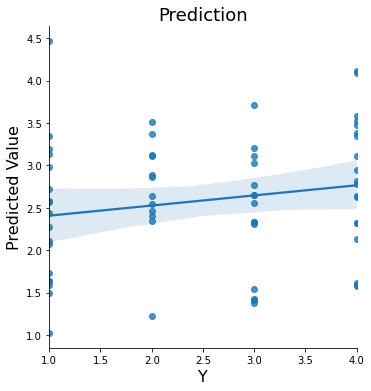

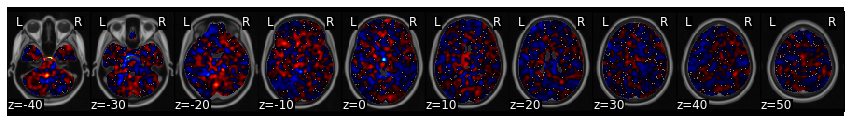

In [15]:
#here we can use nltools Brain_Data format.
predict_result = subj_data.predict(algorithm='ridge',
                  cv_dict={'type':'kfolds','n_folds':5})



In [16]:
subj_data.Y = subj_data.X['liking_rating'].astype(int)

In [17]:
[subj_data.X['liking_rating_f'],liking_rating_factors] =pd.factorize(subj_data.X['liking_cond'])

In [18]:
subj_data.Y = subj_data.X['liking_rating_f']

overall accuracy: 1.00
overall CV accuracy: 0.59


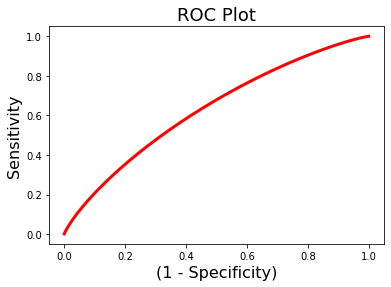

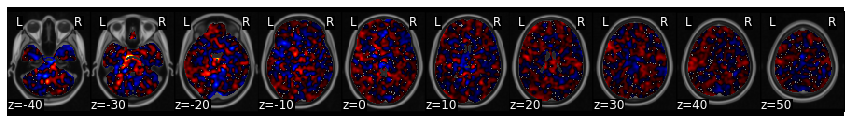

In [19]:
classification_prediction = subj_data.predict(
    algorithm='svm',
    cv_dict={'type':'kfolds','n_folds':5},
    **{'kernel':"linear"})

#### nilearn decoding

In [20]:
from nilearn.image import mean_img

In [21]:
from nilearn import plotting

In [22]:
from nilearn.decoding import Decoder
warnings.warn("Need to check this is exactly the right mask")
decoder = Decoder(estimator='svc', mask=generic_mask_filepath,standardize=True)

<ipython-input-22-4ff34aaa0f42>:2: UserWarning: Need to check this is exactly the right mask
  warnings.warn("Need to check this is exactly the right mask")


In [23]:
#set path for the betas

beta_path_sub049 = os.listdir(subject_dir)

#iterate through the subjects
# TO DO
#iterate through and check all the betas exist
for betafile in subject_behavdesign.beta:
    betafilepath = subject_dir + betafile
    
    #check if file exists
    if os.path.exists(betafilepath):
        print('.',end='')
    else:
        raise Exception("beta " + betafile + ' does not exist')

print("...verified that all expected betas exist!",flush=True)

beta_files = [subject_dir + b for b in subject_behavdesign.beta]

from nilearn import image
subj_data = image.load_img(beta_files)

print('images_loaded')


...................................................................verified that all expected betas exist!
images_loaded


In [24]:
subj_data.shape

(97, 115, 97, 64)

visualize


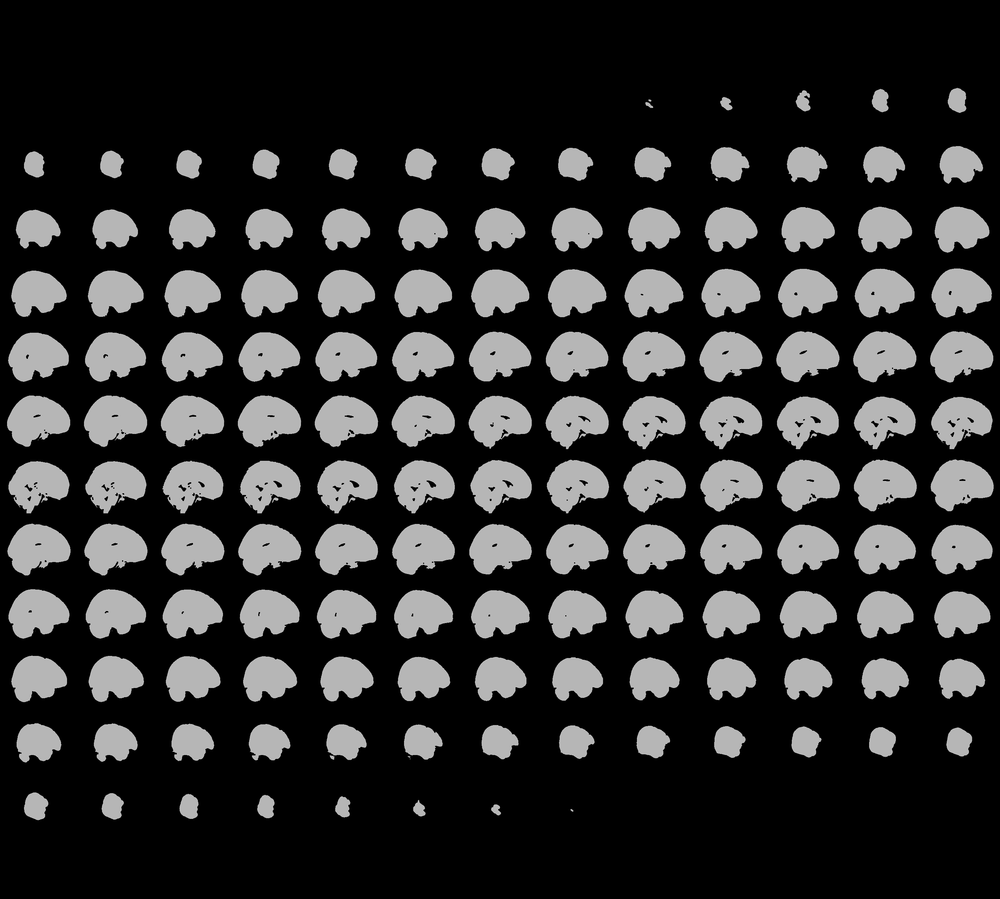
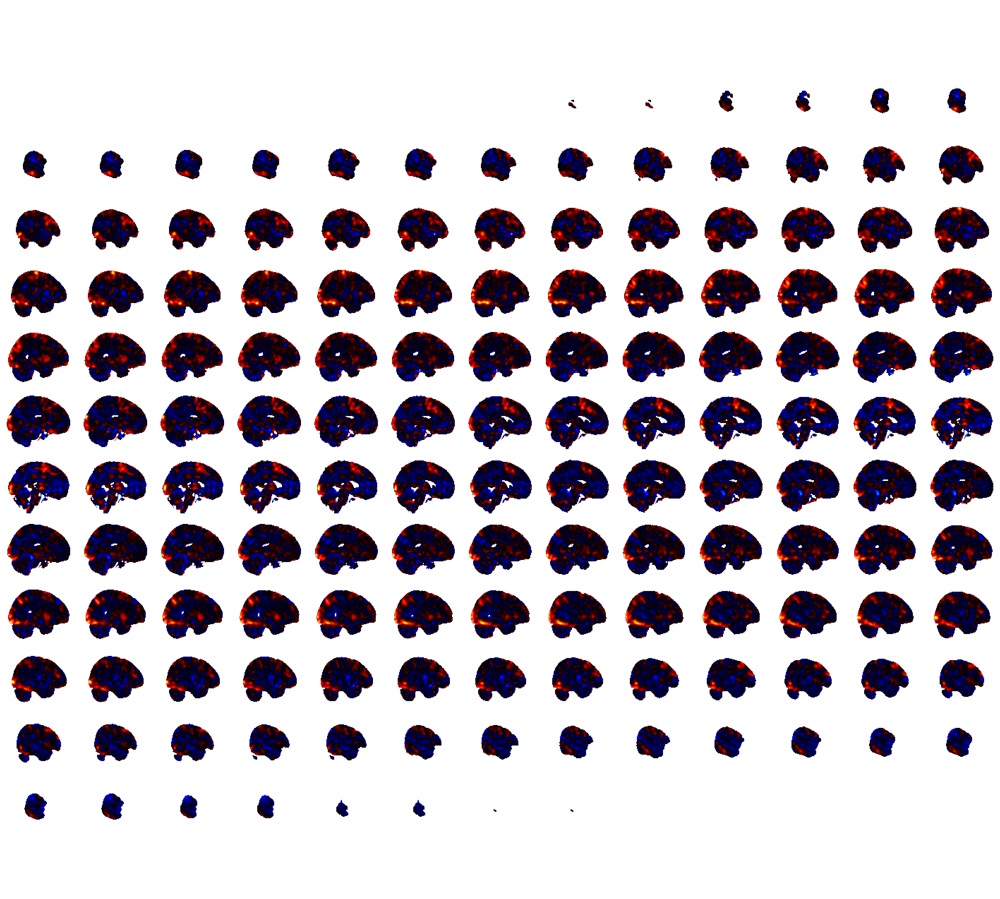

In [31]:
plotting.view_img(mean_img(subj_data),bg_img=generic_mask_filepath)

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



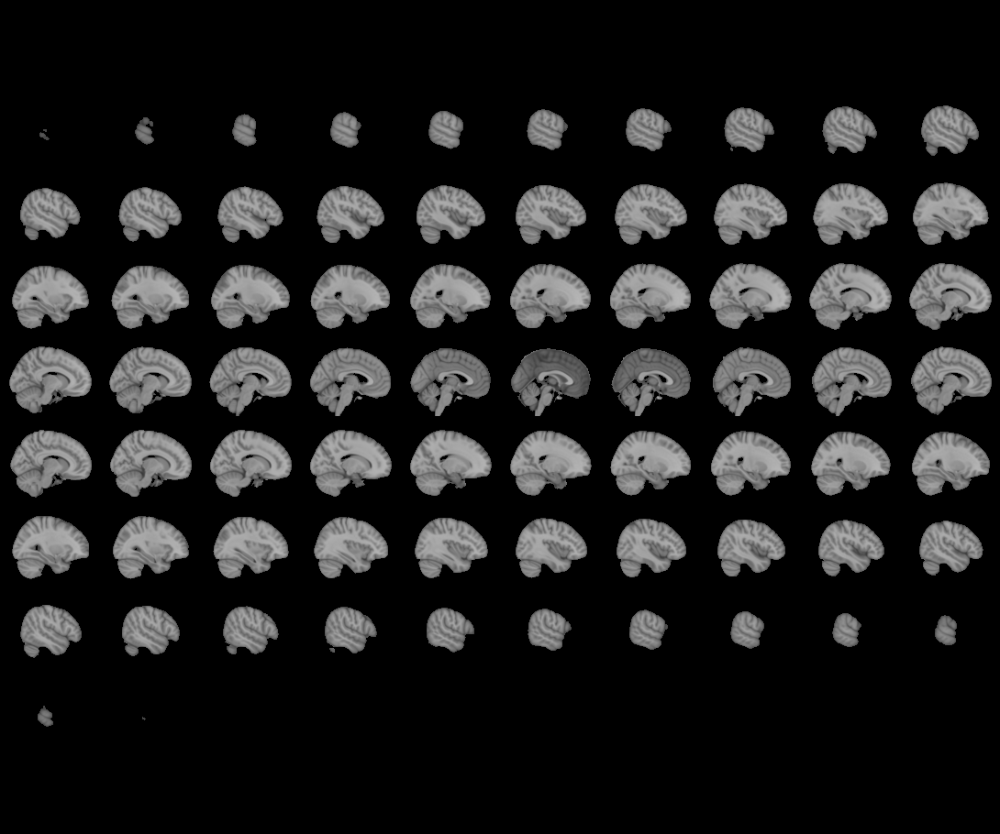
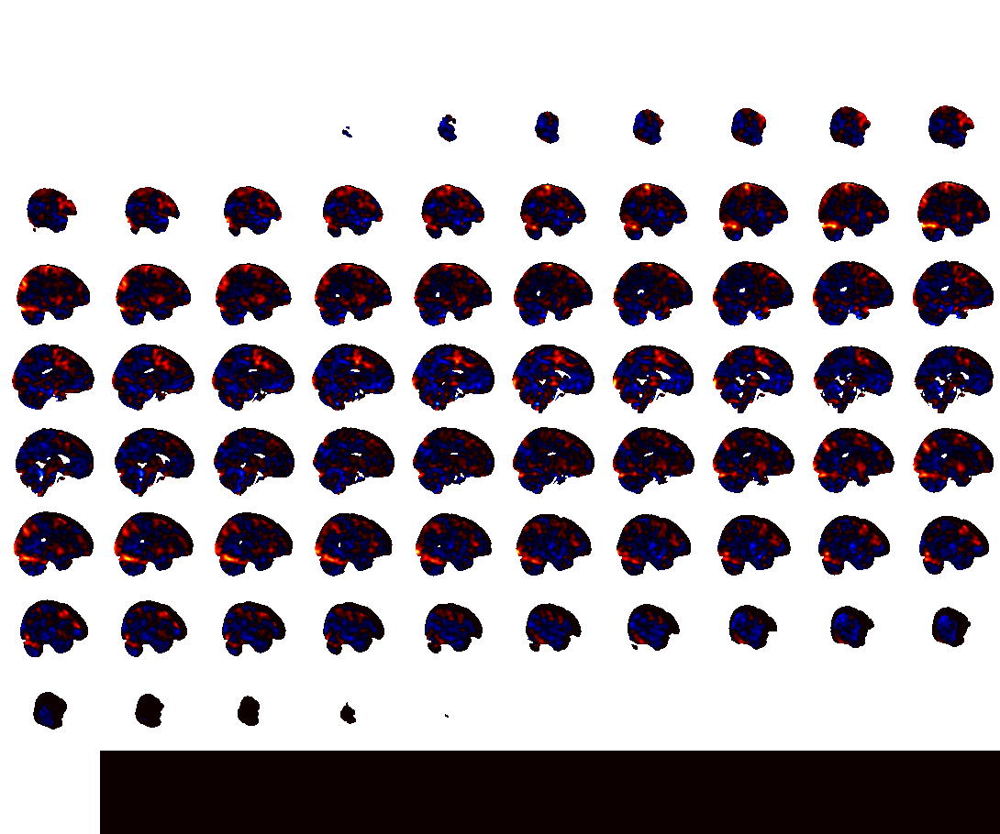

In [32]:
plotting.view_img(mean_img(subj_data))

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:273: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



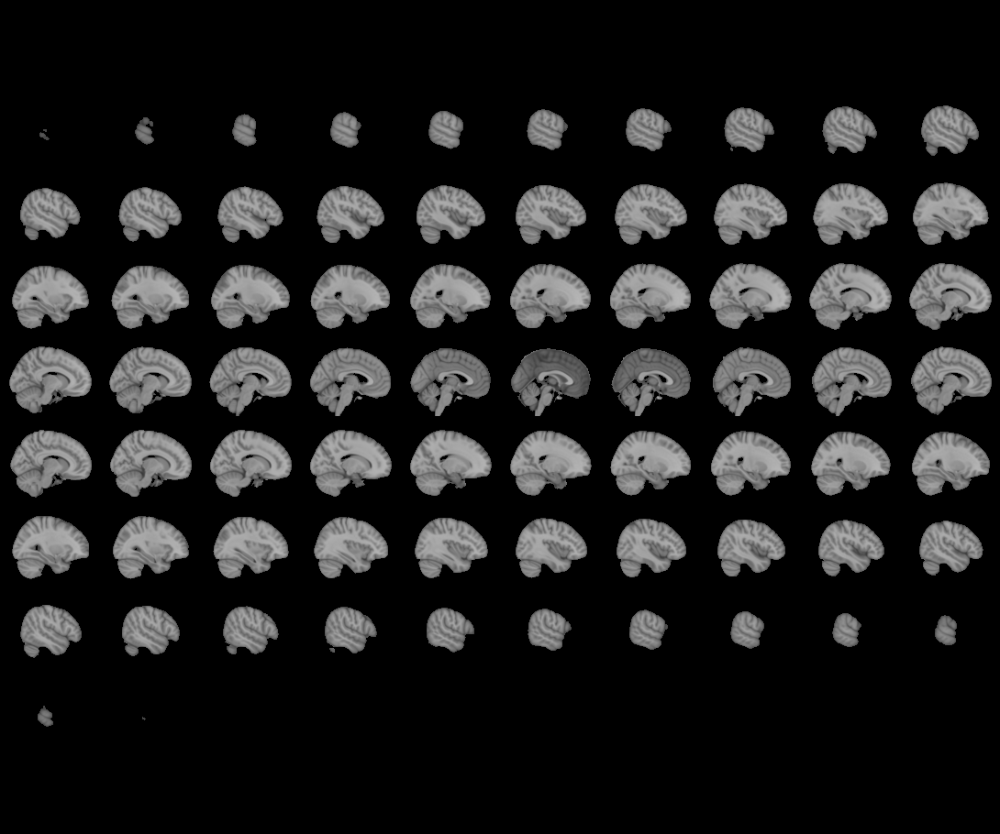
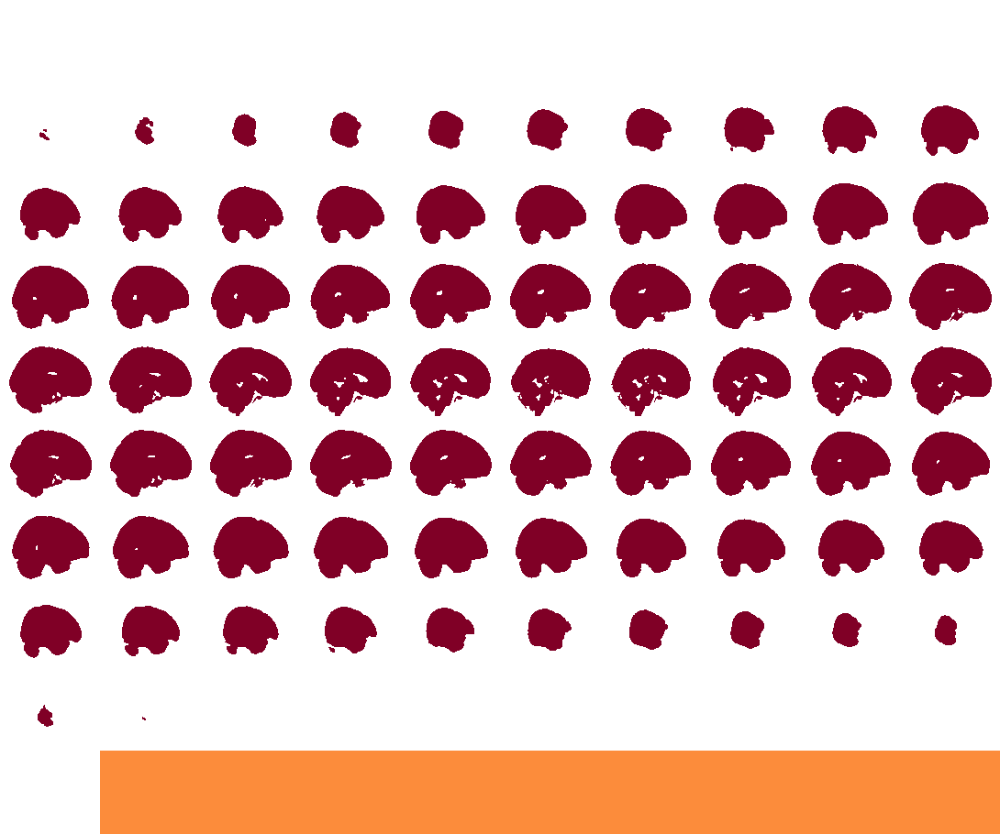

In [33]:
generic_mask_filepath = '/projects/sanlab/shared/spm12/canonical/MNI152_T1_1mm_brain_mask.nii'
plotting.view_img(generic_mask_filepath,opacity=0.7,cmap='YlOrRd')

now with nilearn we really need to use nilearn's own format, not nltools'.

In [26]:
decoder = Decoder(estimator = 'svc', mask = generic_mask_filepath, standardize= True)

In [27]:
pd.factorize(subject_behavdesign.liking_cond)

(array([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1,
        0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1,
        1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0]),
 Index(['liked', 'disliked'], dtype='object'))

In [28]:
prediction = decoder.fit(subj_data, subject_behavdesign.liking_cond)

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:594: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  _resample_one_img(data[all_img + ind], A, b, target_shape,
/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:594: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  _resample_one_img(data[all_img + ind], A, b, target_shape,
/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:594: RuntimeWarning: NaNs or infinite values are present in the data passed to resample. This is a bad thing as they make resampling ill-defined and much slower.
  _resample_one_img(data[all_img + ind], A, b, target_shape,
/home/bsmith16/.conda/envs/neurals

KeyboardInterrupt: 

In [ ]:
# https://stackoverflow.com/questions/25351968/how-to-display-full-non-truncated-dataframe-information-in-html-when-convertin


In [ ]:
coef_ = decoder.coef_img_['liked']

In [ ]:
plotting.view_img(coef_, threshold=None)

### mask follow-up

What's the correct mask to use? It should be something matching the dimensions of the brain image, right?

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:273: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



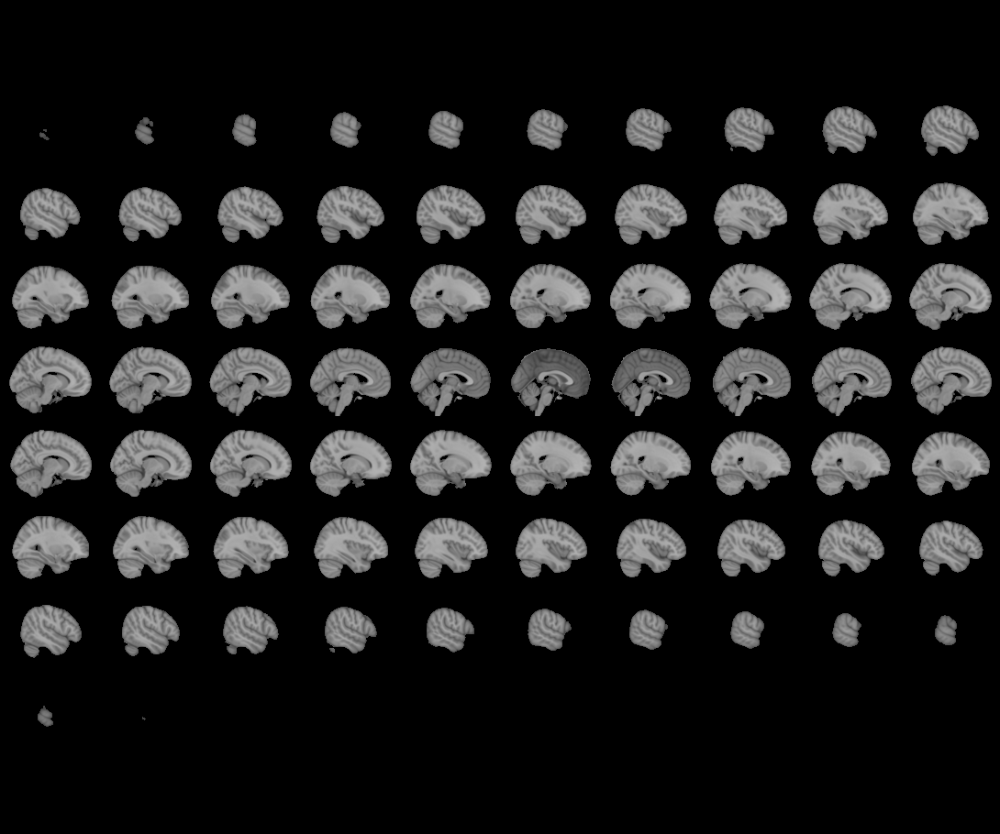
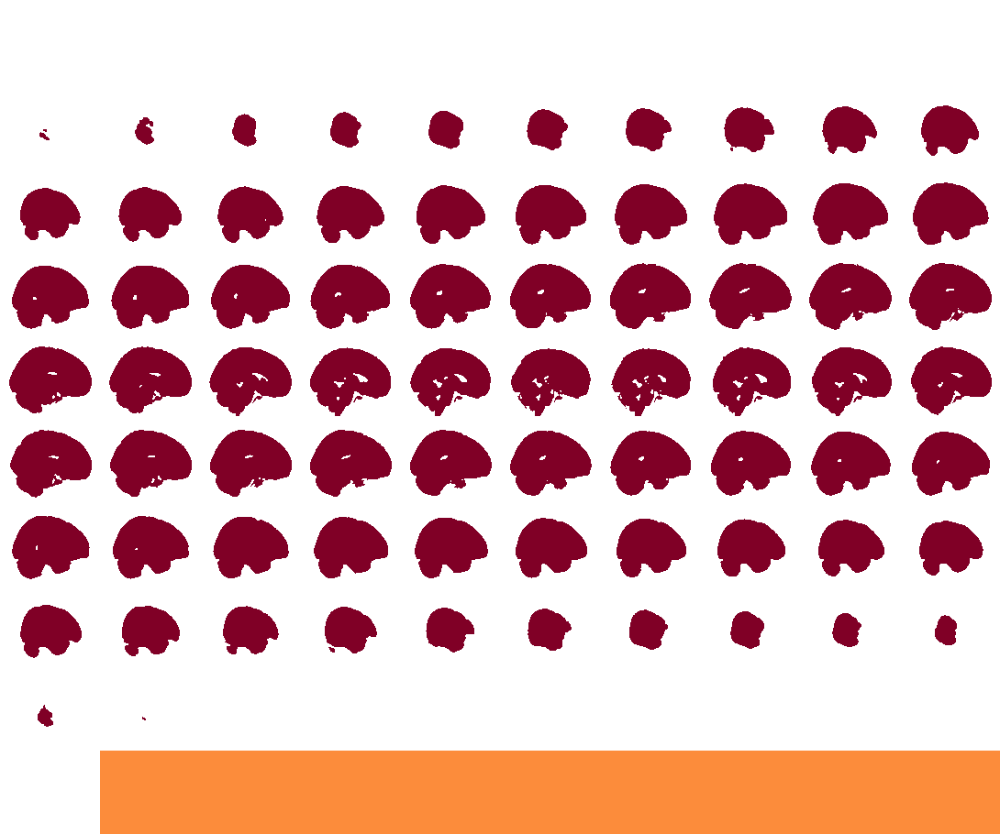

In [27]:
generic_mask_filepath = '/projects/sanlab/shared/spm12/canonical/MNI152_T1_1mm_brain_mask.nii'
plotting.view_img(generic_mask_filepath,opacity=0.7,cmap='YlOrRd')

In [29]:
from nilearn import image

In [30]:
subj_data.shape

(97, 115, 97, 64)

Which mask file matches that?

`mask_file` is a mask file that sits in the subject anat dir. It's not used, to my knowledge.

In [34]:
generic_mask_filepath

'/projects/sanlab/shared/spm12/canonical/MNI152_T1_1mm_brain_mask.nii'

In [35]:
generic_mask_img = image.load_img(generic_mask_filepath)

In [37]:
generic_mask_img.shape

(182, 218, 182)

Nope!

In [38]:
anat_dir = "/gpfs/projects/sanlab/shared/DEV/bids_data/derivatives/fmriprep/sub-DEV049/anat/"

In [40]:
os.listdir(anat_dir)

['sub-DEV049_T1w_class-CSF_probtissue.nii.gz',
 'sub-DEV049_T1w_preproc.nii.gz',
 'sub-DEV049_T1w_space-MNI152NLin2009cAsym_class-GM_probtissue.nii.gz',
 'sub-DEV049_T1w_space-MNI152NLin2009cAsym_brainmask.nii.gz',
 'sub-DEV049_T1w_dtissue.nii.gz',
 'sub-DEV049_T1w_pial.L.surf.gii',
 'sub-DEV049_T1w_smoothwm.L.surf.gii',
 'sub-DEV049_T1w_space-MNI152NLin2009cAsym_class-CSF_probtissue.nii.gz',
 'sub-DEV049_T1w_smoothwm.R.surf.gii',
 'sub-DEV049_T1w_inflated.R.surf.gii',
 'sub-DEV049_T1w_space-MNI152NLin2009cAsym_target-T1w_warp.h5',
 'sub-DEV049_T1w_label-aparcaseg_roi.nii.gz',
 'sub-DEV049_T1w_midthickness.L.surf.gii',
 'sub-DEV049_T1w_brainmask.nii.gz',
 'sub-DEV049_T1w_label-aseg_roi.nii.gz',
 'sub-DEV049_T1w_midthickness.R.surf.gii',
 'sub-DEV049_T1w_class-WM_probtissue.nii.gz',
 'sub-DEV049_T1w_space-MNI152NLin2009cAsym_preproc.nii.gz',
 'sub-DEV049_T1w_target-MNI152NLin2009cAsym_warp.h5',
 'sub-DEV049_T1w_space-MNI152NLin2009cAsym_dtissue.nii.gz',
 'sub-DEV049_T1w_space-MNI152NLin

Also nope!

What mask is reference in the script that creates our subject data?

As per our info flow: https://docs.google.com/presentation/d/1K-nFrZYE6rR8t0myNyacB7frBzV3B1--nMqPhVkwL8E/edit

That script should be `/gpfs/projects/sanlab/shared/DEV/DEV_scripts/fMRI/fx/models/WTP/fx_betaseries_DEV082.m`.

That file mentions the mask below...



In [44]:

mask_generic = image.load_img(generic_mask_filepath)

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



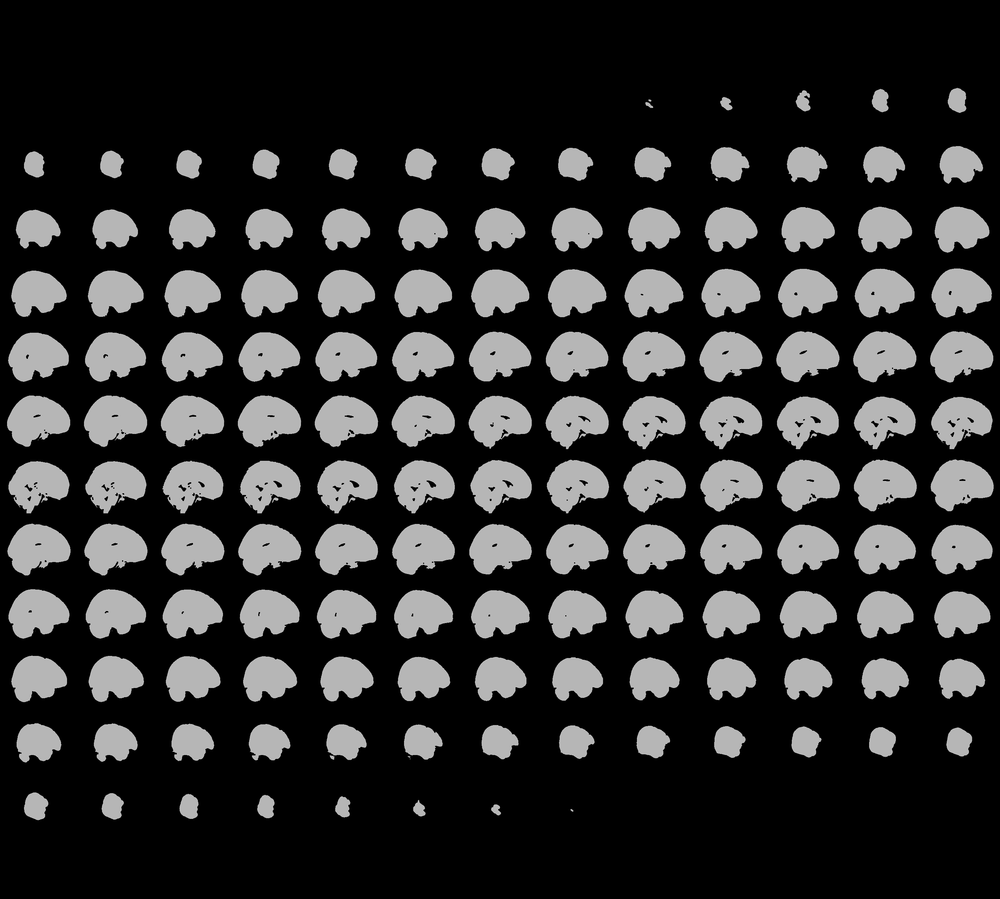
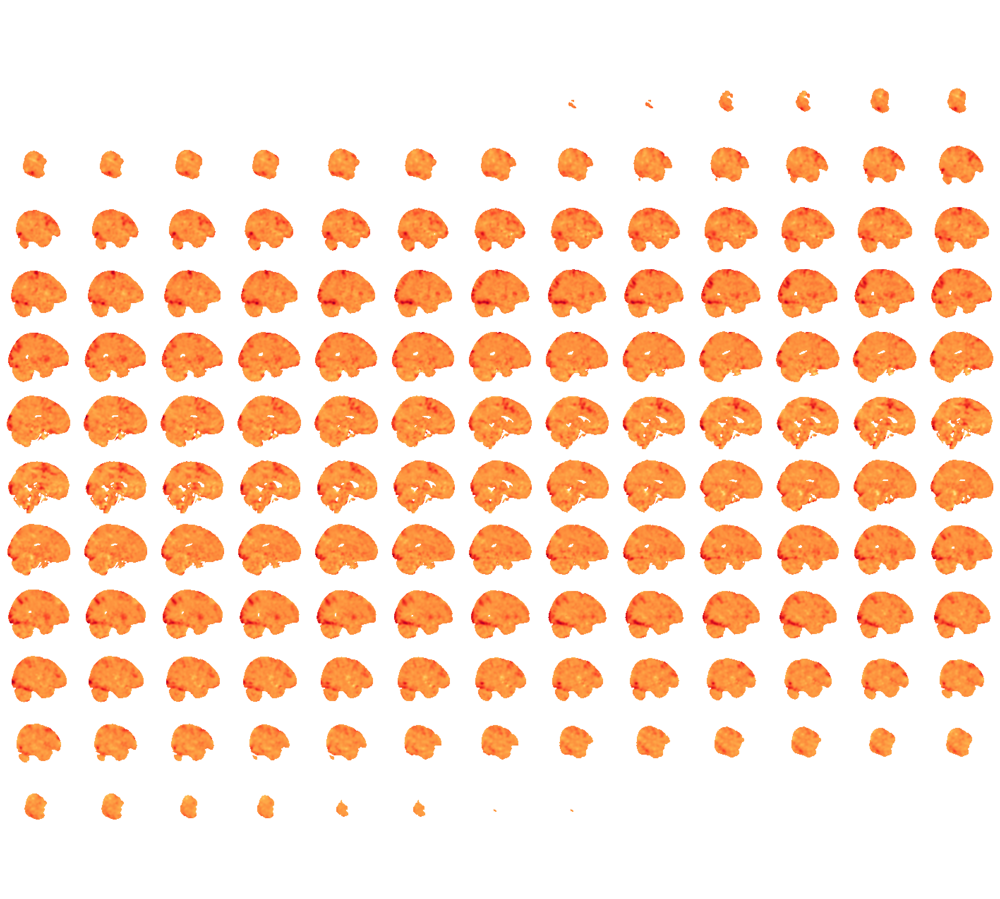

In [45]:
plotting.view_img(image.mean_img(subj_data),bg_img=mask_generic,opacity=0.7,cmap='YlOrRd')

In [46]:
print(image.mean_img(subj_data).affine)

[[   2.    0.    0.  -96.]
 [   0.    2.    0. -132.]
 [   0.    0.    2.  -78.]
 [   0.    0.    0.    1.]]


In [47]:
print(mask_generic.affine)

[[  -1.    0.    0.   90.]
 [   0.    1.    0. -126.]
 [   0.    0.    1.  -72.]
 [   0.    0.    0.    1.]]


In [48]:
nib.save(image.mean_img(subj_data),'subj_data_mean.nii.gz')

In [49]:
mask_generic.shape

(182, 218, 182)

In [50]:
subj_data.shape

(97, 115, 97, 64)

, but it's not that, either.

OK, what if we go earlier in the process and look up where the script is drawing the fMRI file from?

In [51]:
beta_source_folder = '/projects/sanlab/shared/DEV/bids_data/derivatives/fmriprep/sub-DEV049/ses-wave1/func/'

In [52]:
os.listdir(beta_source_folder)

['s6_sub-DEV049_ses-wave1_task-ROC_acq-1_bold_space-MNI152NLin2009cAsym_preproc.nii',
 'sub-DEV049_ses-wave1_task-ROC_acq-1_bold_space-T1w_brainmask.nii.gz',
 'sub-DEV049_ses-wave1_task-ROC_acq-2_bold_space-fsnative.L.func.gii',
 'sub-DEV049_ses-wave1_task-WTP_acq-3_bold_space-fsnative.R.func.gii',
 'sub-DEV049_ses-wave1_task-ROC_acq-4_bold_space-T1w_label-aseg_roi.nii.gz',
 'sub-DEV049_ses-wave1_task-ROC_acq-3_bold_space-T1w_preproc.nii.gz',
 'sub-DEV049_ses-wave1_task-ROC_acq-3_bold_space-fsaverage5.R.func.gii',
 'sub-DEV049_ses-wave1_task-WTP_acq-3_bold_space-MNI152NLin2009cAsym_preproc.nii.gz',
 'sub-DEV049_ses-wave1_task-WTP_acq-3_bold_space-fsnative.L.func.gii',
 'sub-DEV049_ses-wave1_task-WTP_acq-4_bold_confounds.tsv',
 'sub-DEV049_ses-wave1_task-WTP_acq-1_bold_space-T1w_brainmask.nii.gz',
 'sub-DEV049_ses-wave1_task-SST_acq-1_bold_space-fsnative.R.func.gii',
 'sub-DEV049_ses-wave1_task-WTP_acq-3_bold_space-T1w_preproc.nii.gz',
 'sub-DEV049_ses-wave1_task-WTP_acq-2_bold_space-MN

In [53]:
source_filename = 's6_sub-DEV049_ses-wave1_task-WTP_acq-2_bold_space-MNI152NLin2009cAsym_preproc.nii'

In [54]:
source_file = image.load_img(beta_source_folder + source_filename)
print(source_file.shape)

(97, 115, 97, 93)



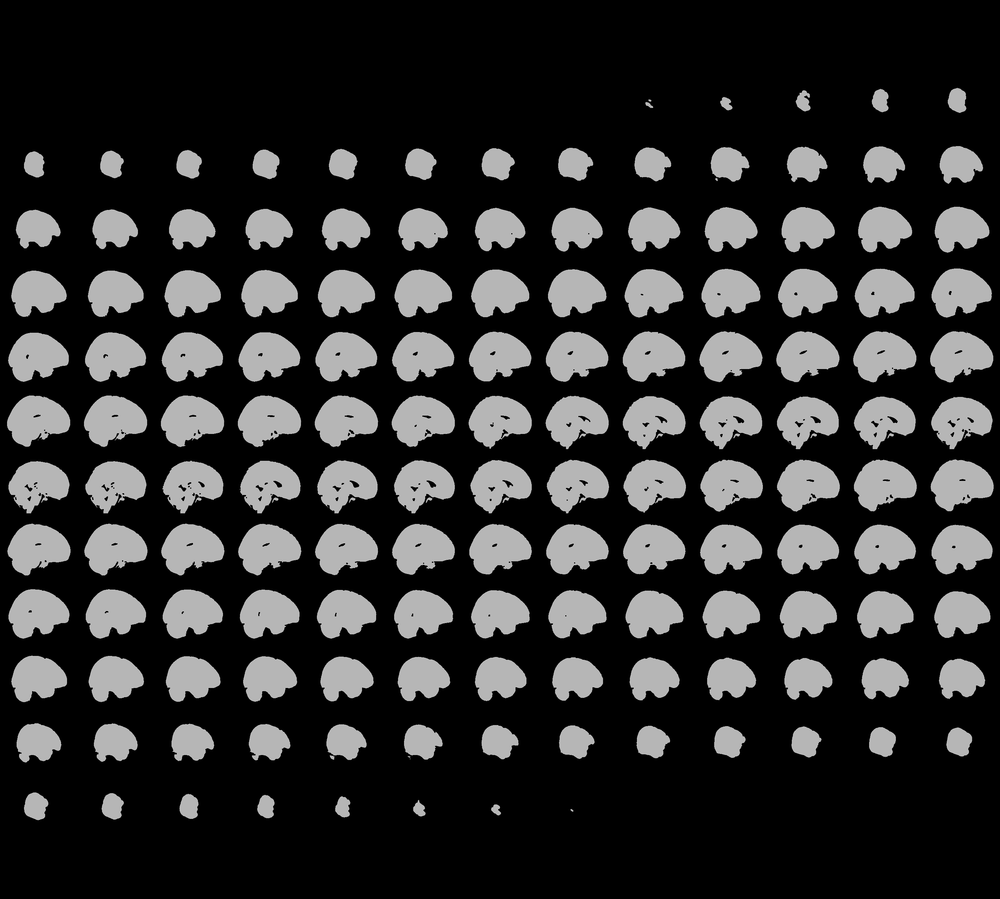
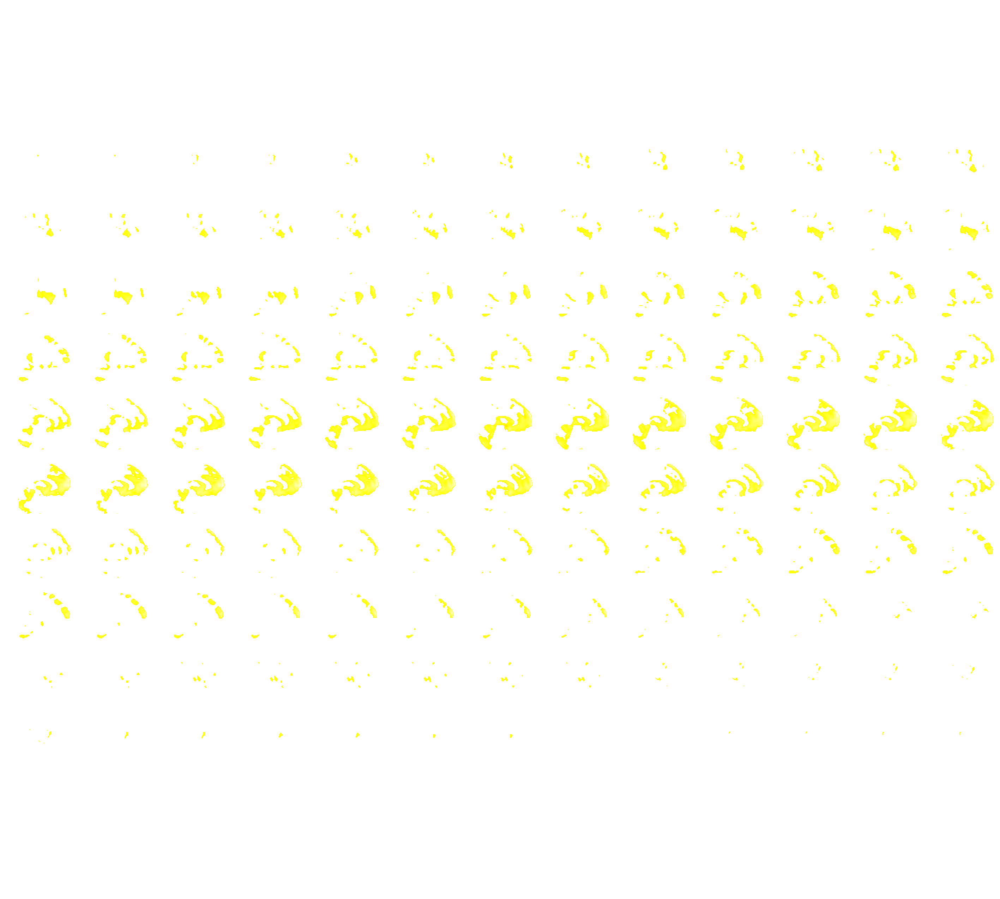

In [56]:
plotting.view_img(mean_img(source_file),bg_img= mask_generic,threshold=8000,opacity=0.5)


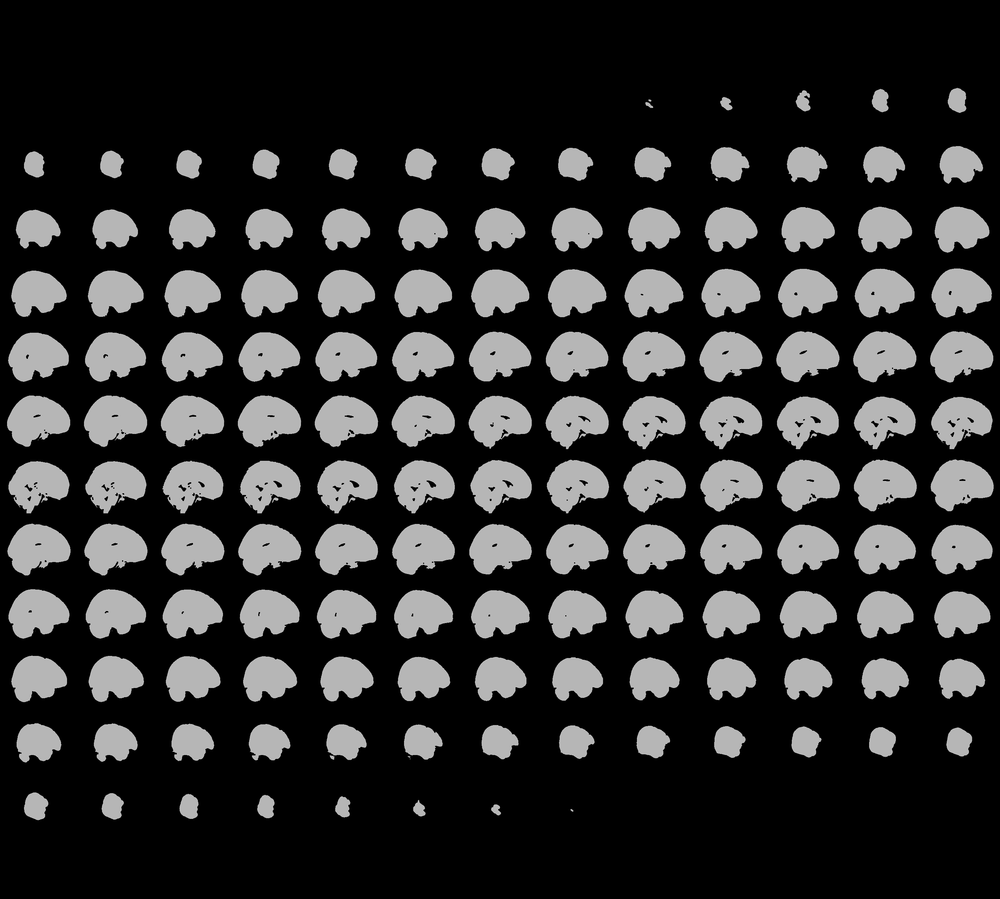
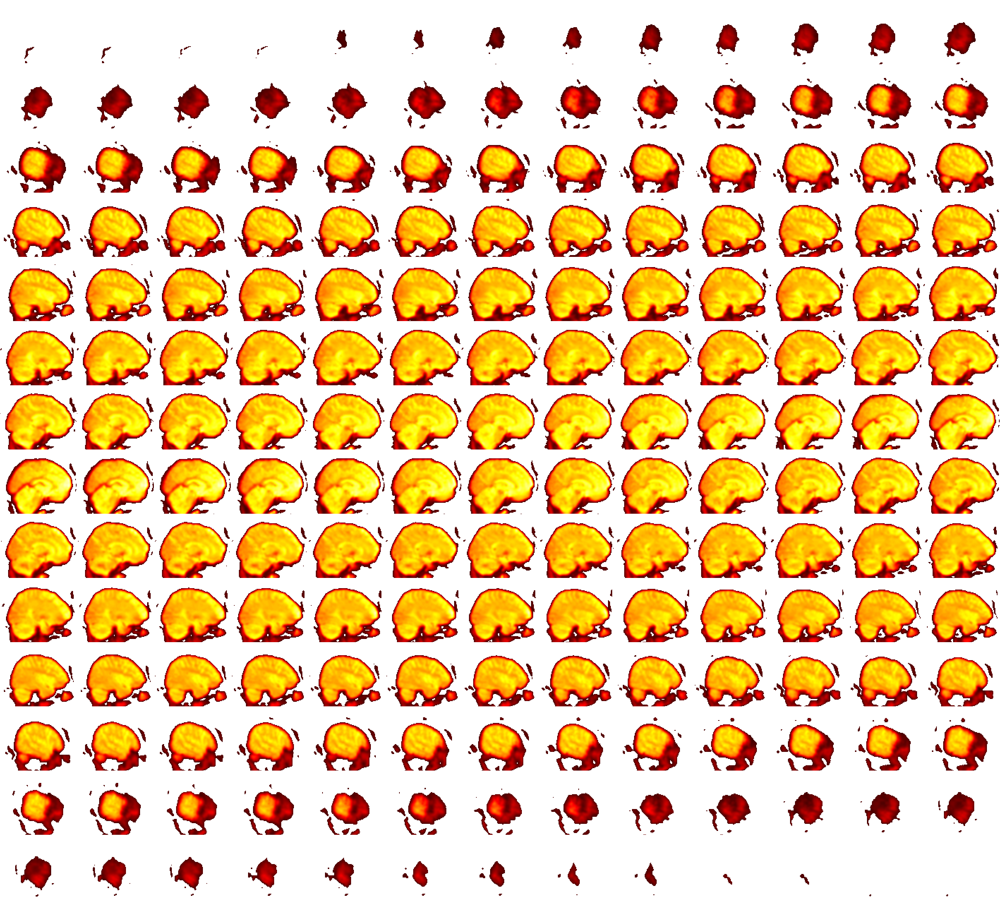

In [57]:
plotting.view_img(mean_img(source_file),bg_img= mask_generic,threshold=1000,opacity=0.5)


At least we know the nilearn package is capable of rendering a mask with different dimensions. It's _probably_? smart enough to process one, too.

that one's familiar:

In [93]:
subj_data.shape

(97, 115, 97, 64)

So why can't we find the mask for it?

well, hold-up, maybe there's some metadata that can hel pus here.

In [100]:
print(subj_data.header)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  4  97 115  97  64   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [1. 2. 2. 2. 0. 1. 1. 1.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : nan
cal_min         : nan
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'spm_spm:beta (0001) - Sn(1) trial1*bf(1)'
aux_file        : b''
qform_code      : aligned
sform_code      : aligned
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : -96.0
qoffset_y       : -132.0
qoffset_z       : -78.0
srow_x

In [103]:
print(source_file.header)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  4  97 115  97  93   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [1. 2. 2. 2. 0. 0. 0. 0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'xform matrices modified by FixHeaderApplyTransforms (niworkflows v0.4.2). - conv'
aux_file        : b''
qform_code      : aligned
sform_code      : aligned
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : -96.0
qoffset_y       :

In [104]:
print(nii_img1.header)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3  97 115  97   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [1. 2. 2. 2. 0. 0. 0. 0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'spm_spm:beta (0001) - Sn(1) trial1*bf(1)'
aux_file        : b''
qform_code      : aligned
sform_code      : aligned
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : -96.0
qoffset_y       : -132.0
qoffset_z       : -78.0
srow_x

#### Visualize the na data

Maybe we can actually just visualize it directly to see what it's talking about?

In [63]:
source_file2 = image.load_img(beta_source_folder + source_filename)

In [77]:
np.sum(np.isfinite(mean_img(source_file).get_fdata())==False)

0

In [91]:
image.load_img(mask_file).affine

array([[   1.,    0.,    0.,  -96.],
       [   0.,    1.,    0., -132.],
       [   0.,    0.,    1.,  -78.],
       [   0.,    0.,    0.,    1.]])

In [92]:
subject_behavdesign.liking_cond

478         liked
1124        liked
1770        liked
2416     disliked
3062        liked
3708     disliked
4354        liked
5000     disliked
5646        liked
6292     disliked
6938     disliked
7584     disliked
8230     disliked
8876     disliked
9522        liked
10168       liked
10806       liked
11443       liked
12080       liked
12717    disliked
13354       liked
13991    disliked
14628       liked
15265    disliked
15902       liked
16539    disliked
17176    disliked
17813    disliked
18450    disliked
19087    disliked
19724       liked
20361       liked
20784       liked
21125       liked
21466       liked
21807    disliked
22148       liked
22489    disliked
22830       liked
23171    disliked
23512       liked
23853    disliked
24194    disliked
24535    disliked
24876    disliked
25217    disliked
25558       liked
25899       liked
26239       liked
26578       liked
26917       liked
27256    disliked
27595       liked
27934    disliked
28273       liked
28612    d

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [89]:

decoder = Decoder(estimator = 'svc', mask = mask_file, standardize= True)
prediction = decoder.fit(subj_data, subject_behavdesign.liking_cond)

ValueError: Mask affine: 
[[   1.    0.    0.  -96.]
 [   0.    1.    0. -132.]
 [   0.    0.    1.  -78.]
 [   0.    0.    0.    1.]]
 is different from img affine:
[[   2.    0.    0.  -96.]
 [   0.    2.    0. -132.]
 [   0.    0.    2.  -78.]
 [   0.    0.    0.    1.]]

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



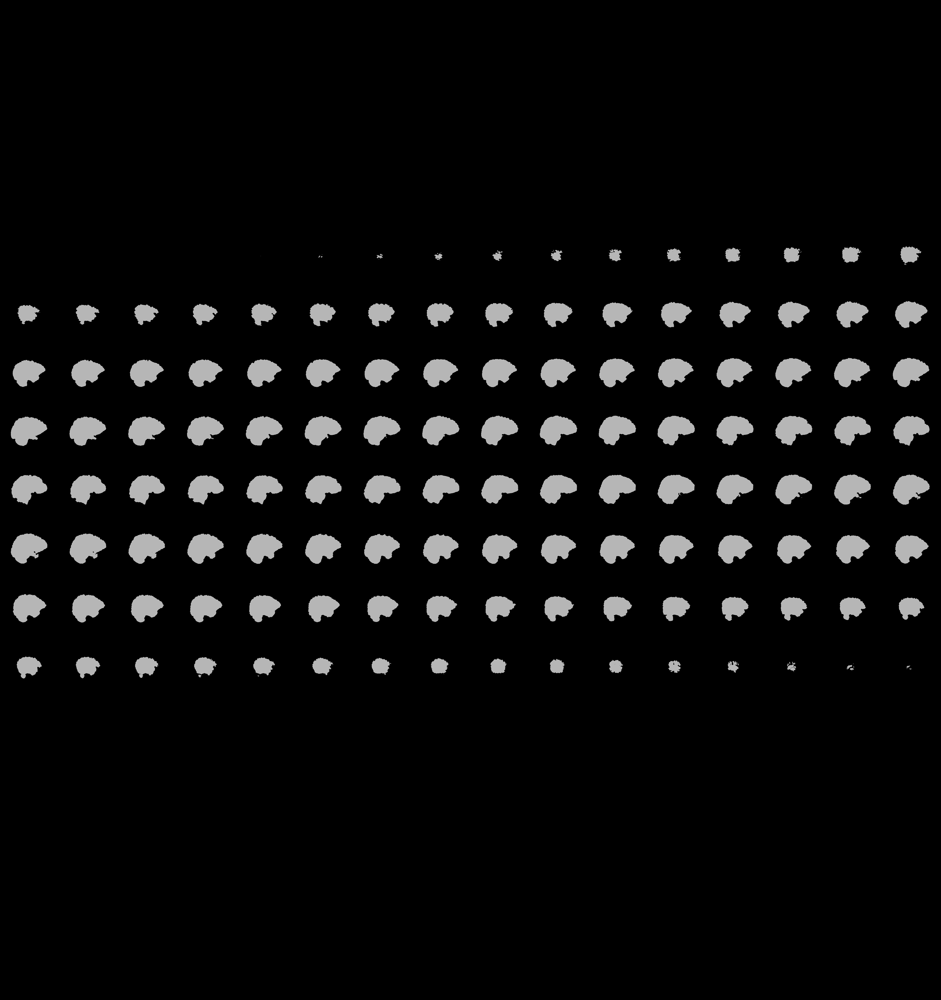
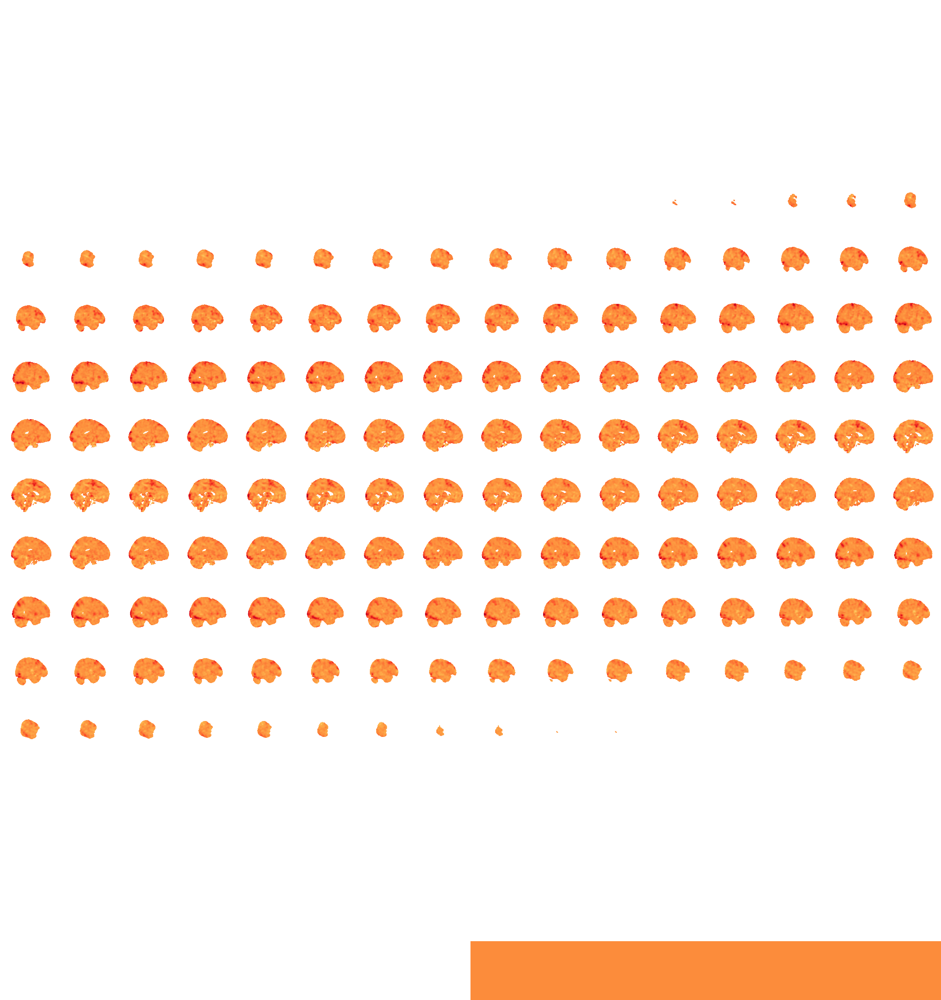

In [97]:
plotting.view_img(image.mean_img(subj_data),bg_img=mask_img,opacity=0.5,cmap='YlOrRd')

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


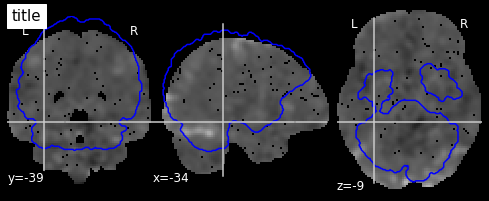

In [95]:
display = plotting.plot_anat(image.mean_img(subj_data),title='title',
                             cut_coords=[-34, -39, -9],threshold=0.01)
display.add_contours(mask_img,levels=[0.5], colors='b')

In [ ]:
generic_mask_image_filepath = 

In [58]:
non_finite_vals = (np.isfinite(image.mean_img(subj_data).get_fdata())==False).astype(int)
non_finite_img = nib.Nifti1Image(non_finite_vals,subj_data.affine)
finite_vals = np.isfinite(image.mean_img(subj_data).get_fdata()).astype(int)
finite_img = nib.Nifti1Image(finite_vals,subj_data.affine)

In [59]:
finite_vals.sum()

228328

In [60]:
(finite_vals & non_finite_vals).sum()

0

In [61]:
non_finite_vals.sum()

853707

In [62]:
non_finite_img.get_fdata()[40,40,50]

0.0

In [63]:
nib.save(non_finite_img,'non_finite_img.nii.gz')

In [64]:
nib.save(finite_img,'finite_img.nii.gz')

In [65]:
finite_img.affine

array([[   2.,    0.,    0.,  -96.],
       [   0.,    2.,    0., -132.],
       [   0.,    0.,    2.,  -78.],
       [   0.,    0.,    0.,    1.]])

I opened these up in FSLeyes. The non-finite parts of the image are outside a brain mask. Probably the mask that is being applied isn't a perfect fit. Let's take a look at that--also in fsleyes...
Viewing in fsleyes, there is some _very few_ voxels that seem to be non-finite in the image but in the mask. We can do a formal test for this, too, though, perhaps not, because the affines are different!

We could use the image's own non-finite space as a 

In [66]:
np.round(mask_img.affine,2)

array([[ 1.0000e+00, -1.0000e-02,  2.0000e-02, -1.2642e+02],
       [ 1.0000e-02,  1.0000e+00,  0.0000e+00, -1.5320e+02],
       [-2.0000e-02, -0.0000e+00,  1.0000e+00, -1.4344e+02],
       [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:527: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:273: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



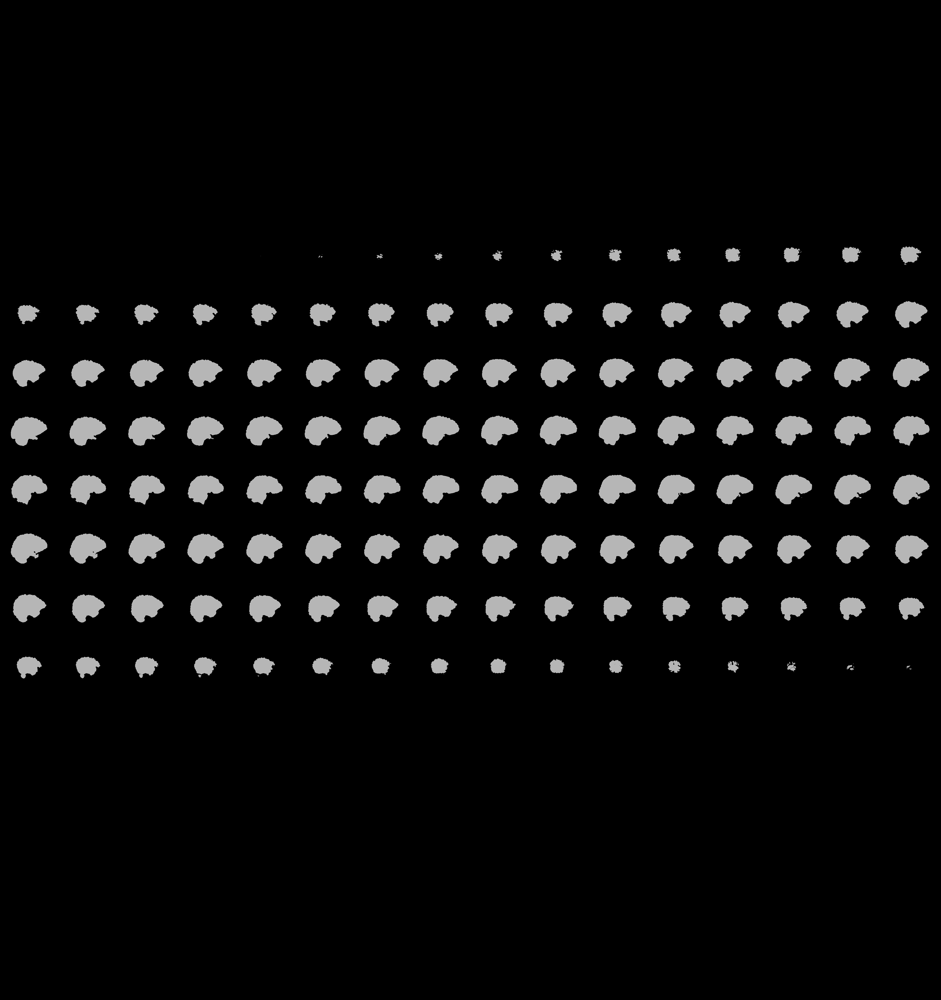
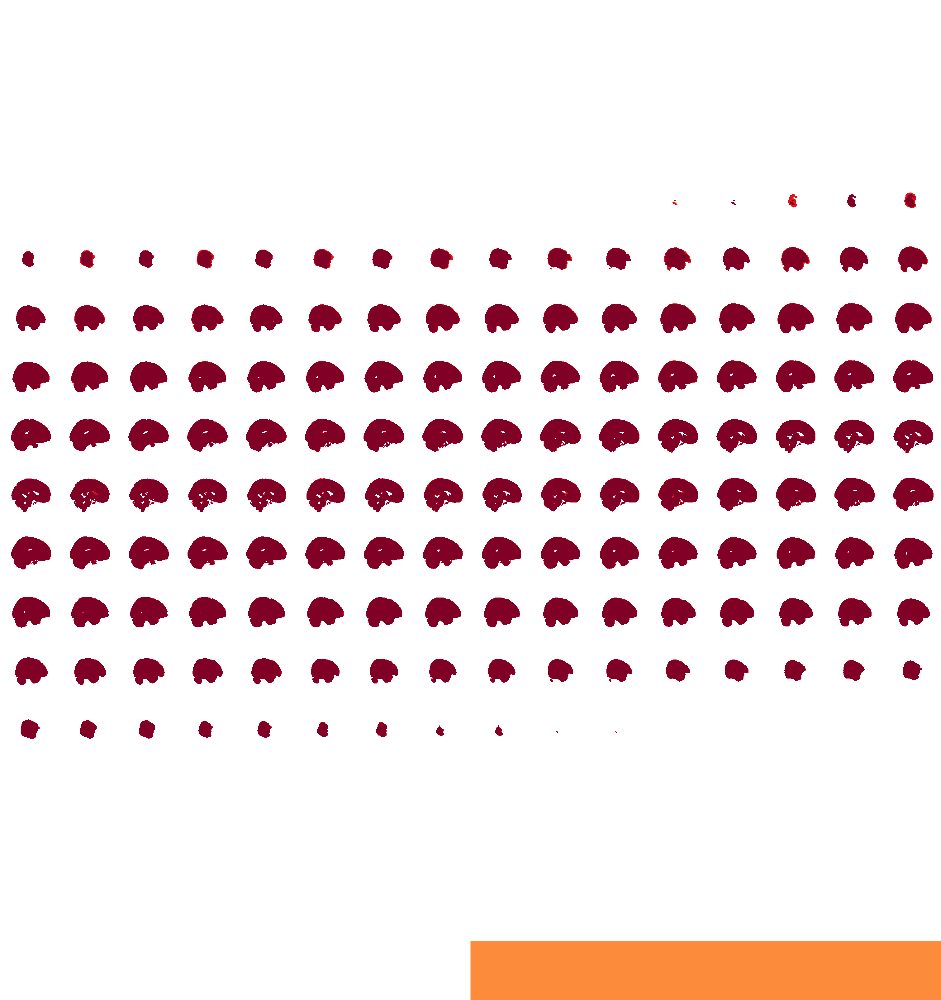

In [69]:
plotting.view_img(finite_img,bg_img= mask_img,opacity=1,cmap='YlOrRd')

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:527: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:273: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



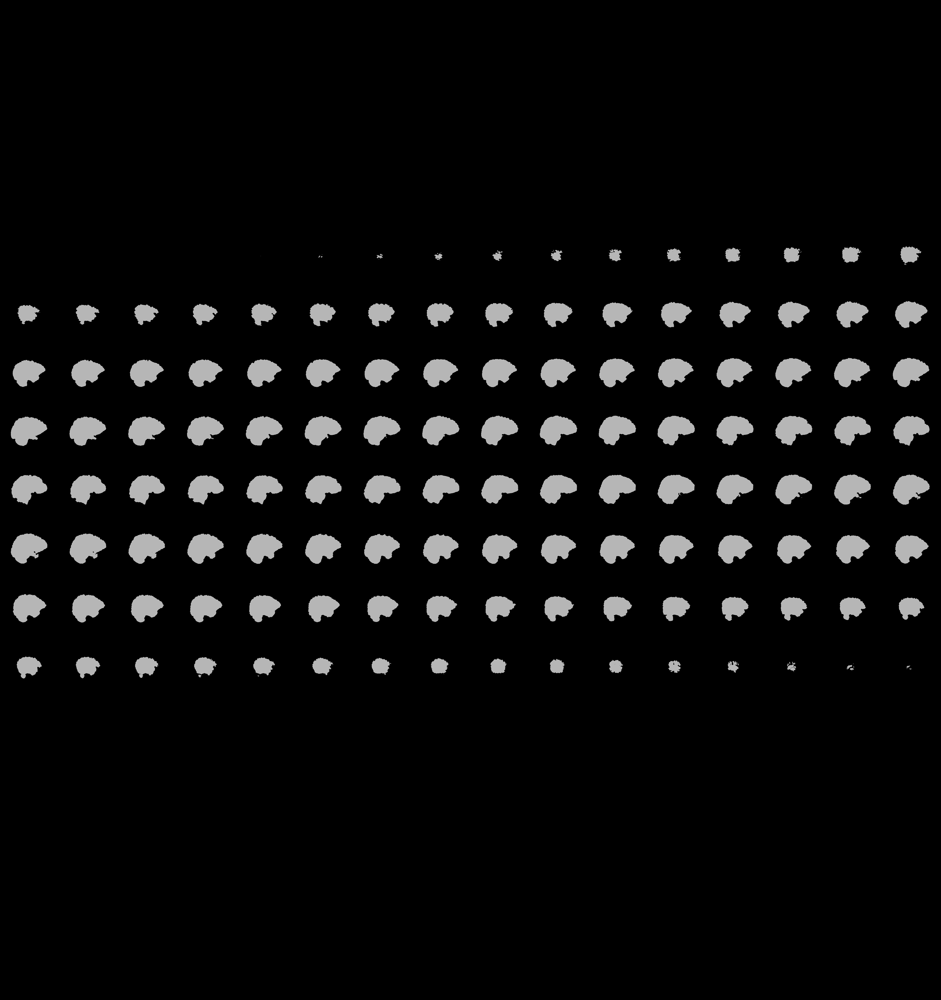
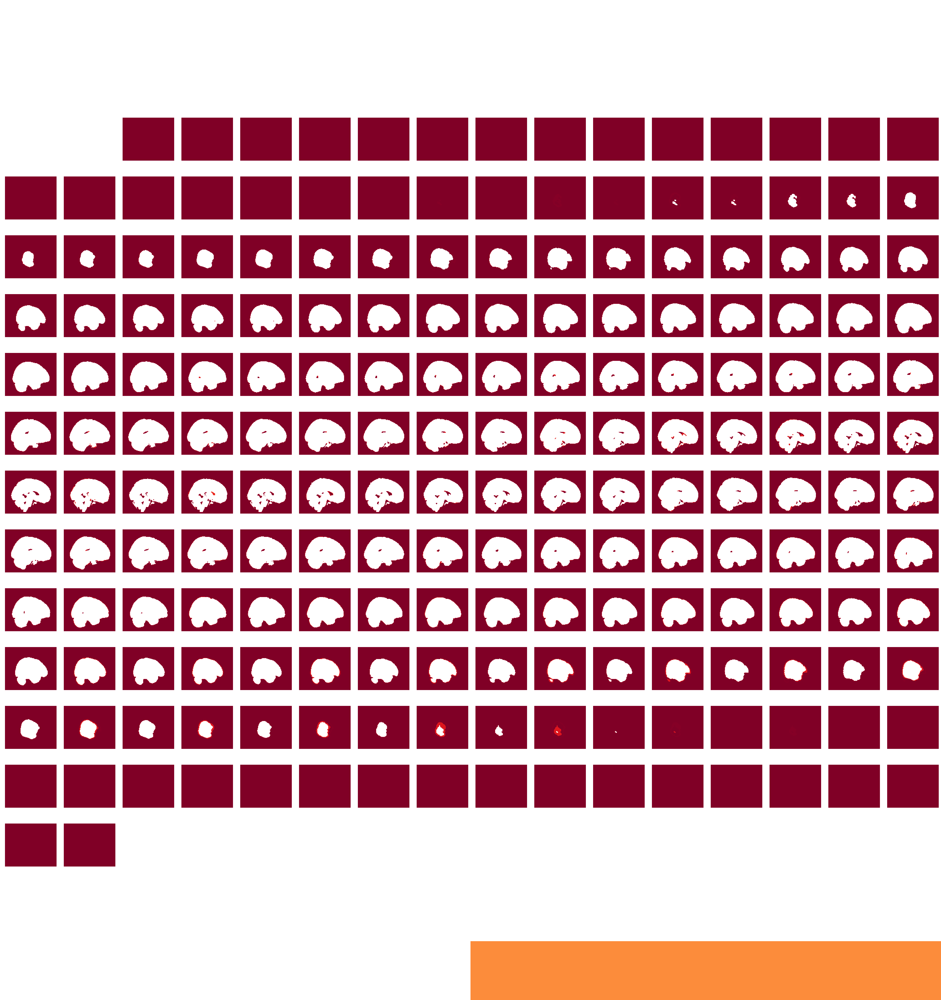

In [71]:
plotting.view_img(non_finite_img,bg_img=mask_img,opacity=0.5,cmap='YlOrRd')

/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:527: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/image/resampling.py:273: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "
/home/bsmith16/.conda/envs/neuralsignature/lib/python3.8/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



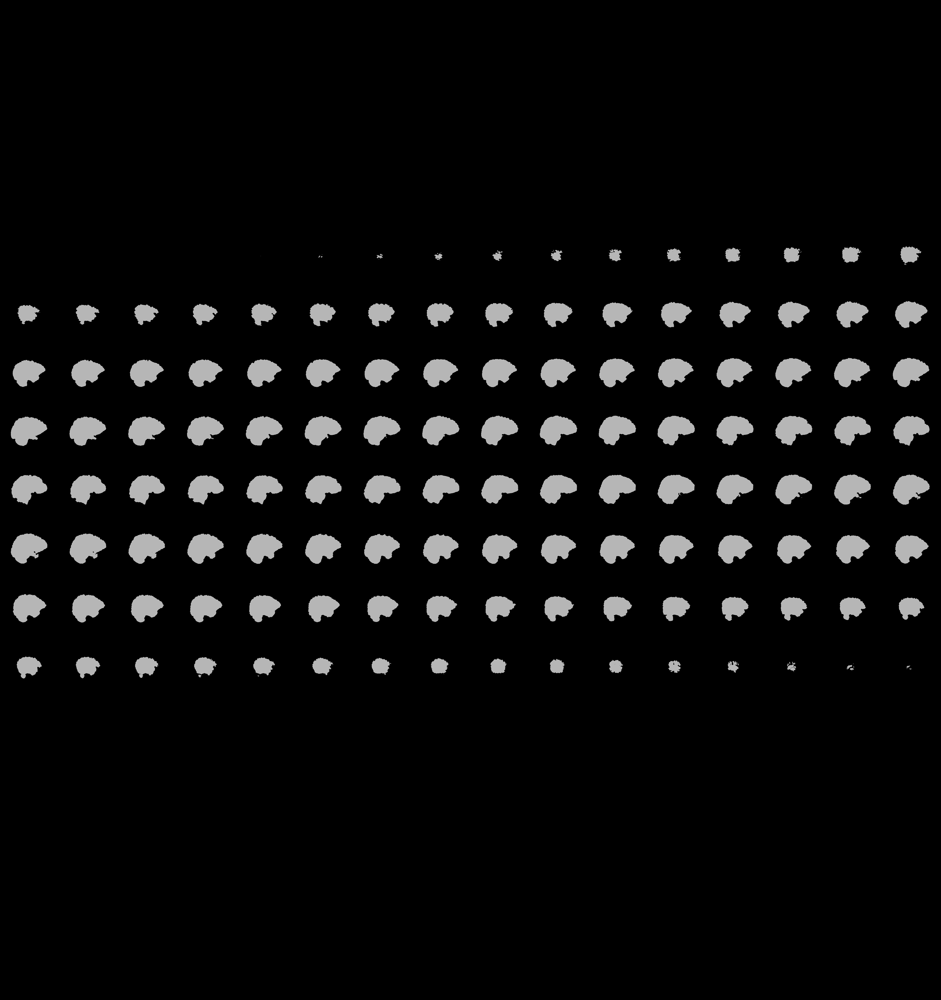
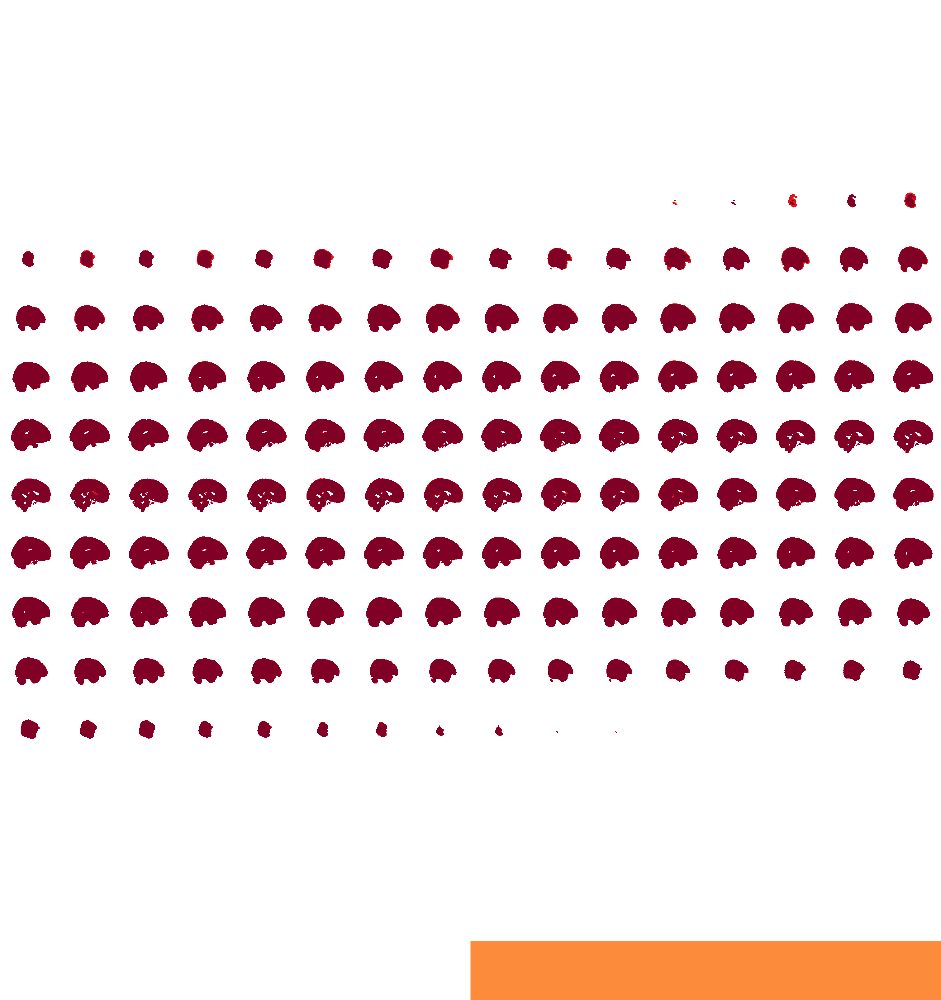

In [73]:
plotting.view_img(finite_img,bg_img=mask_img,opacity=0.5,cmap='YlOrRd')

In [75]:
np.sum(non_finite_vals)

0

Regarding resampling:

https://neurostars.org/t/how-does-niftimasker-work-when-dealing-with-mask-and-data-images-of-different-resolutions/4892

https://github.com/nilearn/nilearn/blob/679ff38923629d0e31b7098fd88200b988aab5f8/nilearn/input_data/base_masker.py#L80

Asked a question here. Let's see how that goes, and move on to perhaps importing multiple subjects' data.

https://neurostars.org/t/how-to-verify-that-resampling-is-not-invalidating-my-decoder-in-nilearn/19413